# AIRLINE PASSENGER SATISFACTION SYSTEM PART 1

Data Source: https://www.kaggle.com/datasets/ahmedelsharkaw/airline-passenger-satisfaction?select=airline_passenger_satisfaction.csv

## IMPORTING NECESSARY PACKAGES

In [33]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

## DATA DESCRIPTION

In [34]:
df=pd.read_csv('airline.csv')
df

,ID,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,1,Male,48,First-time,Business,Business,821,2,5.0,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,2,Female,35,Returning,Business,Business,821,26,39.0,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,3,Male,41,Returning,Business,Business,853,0,0.0,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,4,Male,50,Returning,Business,Business,1905,0,0.0,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,5,Female,49,Returning,Business,Business,3470,0,1.0,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129876,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,129877,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,129878,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,129879,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [35]:
# Information on the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype  
---  ------                                  --------------   -----  
 0   ID                                      129880 non-null  int64  
 1   Gender                                  129880 non-null  object 
 2   Age                                     129880 non-null  int64  
 3   Customer Type                           129880 non-null  object 
 4   Type of Travel                          129880 non-null  object 
 5   Class                                   129880 non-null  object 
 6   Flight Distance                         129880 non-null  int64  
 7   Departure Delay                         129880 non-null  int64  
 8   Arrival Delay                           129487 non-null  float64
 9   Departure and Arrival Time Convenience  129880 non-null  int64  
 10  Ease of Online Booking                  1298

In [36]:
# Description of the dataframe
df.describe()

,ID,Age,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,Check-in Service,Online Boarding,Gate Location,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling
count,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000
mean,64940.500000,39.427957,1190.316392,14.713713,15.091129,3.057599,2.756876,3.306267,3.252633,2.976925,3.383023,3.441361,3.350878,3.286326,3.204774,3.642193,2.728696,3.358077,3.632114
std,37493.270818,15.119360,997.452477,38.071126,38.465650,1.526741,1.401740,1.266185,1.350719,1.278520,1.287099,1.319289,1.316252,1.313682,1.329933,1.176669,1.329340,1.334049,1.180025
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,32470.750000,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,3.000000
50%,64940.500000,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,4.000000
75%,97410.250000,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,5.000000
max,129880.000000,85.000000,4983.000000,1592.000000,1584.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [37]:
# Description of the dataframe including object 
df.describe(include='O')

,Gender,Customer Type,Type of Travel,Class,Satisfaction
count,129880,129880,129880,129880,129880
unique,2,2,2,3,2
top,Female,Returning,Business,Business,Neutral or Dissatisfied
freq,65899,106100,89693,62160,73452


In [38]:
# Shape of the dataframe
num_rows, num_cols = df.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 129880
Number of columns: 24


In [39]:
# Displaying unique values in each attribute
df.nunique()

ID                                        129880
Gender                                         2
Age                                           75
Customer Type                                  2
Type of Travel                                 2
Class                                          3
Flight Distance                             3821
Departure Delay                              466
Arrival Delay                                472
Departure and Arrival Time Convenience         6
Ease of Online Booking                         6
Check-in Service                               6
Online Boarding                                6
Gate Location                                  6
On-board Service                               6
Seat Comfort                                   6
Leg Room Service                               6
Cleanliness                                    6
Food and Drink                                 6
In-flight Service                              6
In-flight Wifi Servi

## DATA CLEANING

In [40]:
# Checking null values in dataframe
df.isnull().sum()

ID                                          0
Gender                                      0
Age                                         0
Customer Type                               0
Type of Travel                              0
Class                                       0
Flight Distance                             0
Departure Delay                             0
Arrival Delay                             393
Departure and Arrival Time Convenience      0
Ease of Online Booking                      0
Check-in Service                            0
Online Boarding                             0
Gate Location                               0
On-board Service                            0
Seat Comfort                                0
Leg Room Service                            0
Cleanliness                                 0
Food and Drink                              0
In-flight Service                           0
In-flight Wifi Service                      0
In-flight Entertainment           

In [41]:
# Dropping null valued rows
df.dropna(inplace=True)

In [42]:
# Checking for duplicated rows 
df.duplicated().any()

False

In [43]:
# Drop ID columns
df = df.drop(columns=["ID"])
df

,Gender,Age,Customer Type,Type of Travel,Class,Flight Distance,Departure Delay,Arrival Delay,Departure and Arrival Time Convenience,Ease of Online Booking,...,On-board Service,Seat Comfort,Leg Room Service,Cleanliness,Food and Drink,In-flight Service,In-flight Wifi Service,In-flight Entertainment,Baggage Handling,Satisfaction
0,Male,48,First-time,Business,Business,821,2,5.0,3,3,...,3,5,2,5,5,5,3,5,5,Neutral or Dissatisfied
1,Female,35,Returning,Business,Business,821,26,39.0,2,2,...,5,4,5,5,3,5,2,5,5,Satisfied
2,Male,41,Returning,Business,Business,853,0,0.0,4,4,...,3,5,3,5,5,3,4,3,3,Satisfied
3,Male,50,Returning,Business,Business,1905,0,0.0,2,2,...,5,5,5,4,4,5,2,5,5,Satisfied
4,Female,49,Returning,Business,Business,3470,0,1.0,3,3,...,3,4,4,5,4,3,3,3,3,Satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,Male,28,Returning,Personal,Economy Plus,447,2,3.0,4,4,...,5,1,4,4,4,5,4,4,4,Neutral or Dissatisfied
129876,Male,41,Returning,Personal,Economy Plus,308,0,0.0,5,3,...,5,2,5,2,2,4,3,2,5,Neutral or Dissatisfied
129877,Male,42,Returning,Personal,Economy Plus,337,6,14.0,5,2,...,3,3,4,3,3,4,2,3,5,Neutral or Dissatisfied
129878,Male,50,Returning,Personal,Economy Plus,337,31,22.0,4,4,...,4,4,5,3,3,4,5,3,5,Satisfied


In [44]:
# Coverting datatypes of the columns
columns_to_convert = ['Gender', 'Customer Type', 'Type of Travel', 'Class','Departure and Arrival Time Convenience','Ease of Online Booking',
                      'Check-in Service', 'Online Boarding', 'Gate Location','On-board Service', 'Seat Comfort', 'Leg Room Service',
                      'Cleanliness','Food and Drink', 'In-flight Service', 'In-flight Wifi Service','In-flight Entertainment', 
                      'Baggage Handling','Satisfaction']

df[columns_to_convert] = df[columns_to_convert].astype('category')

print(df.dtypes)

Gender                                    category
Age                                          int64
Customer Type                             category
Type of Travel                            category
Class                                     category
Flight Distance                              int64
Departure Delay                              int64
Arrival Delay                              float64
Departure and Arrival Time Convenience    category
Ease of Online Booking                    category
Check-in Service                          category
Online Boarding                           category
Gate Location                             category
On-board Service                          category
Seat Comfort                              category
Leg Room Service                          category
Cleanliness                               category
Food and Drink                            category
In-flight Service                         category
In-flight Wifi Service         

In [45]:
# Converting datatypes
df['Departure Delay']=df['Departure Delay'].astype('float64')

In [46]:
# Renaming column names 
df.rename(columns={'Departure and Arrival Time Convenience': 'Time_Convenience'}, inplace=True)

### SANITY CHECKING

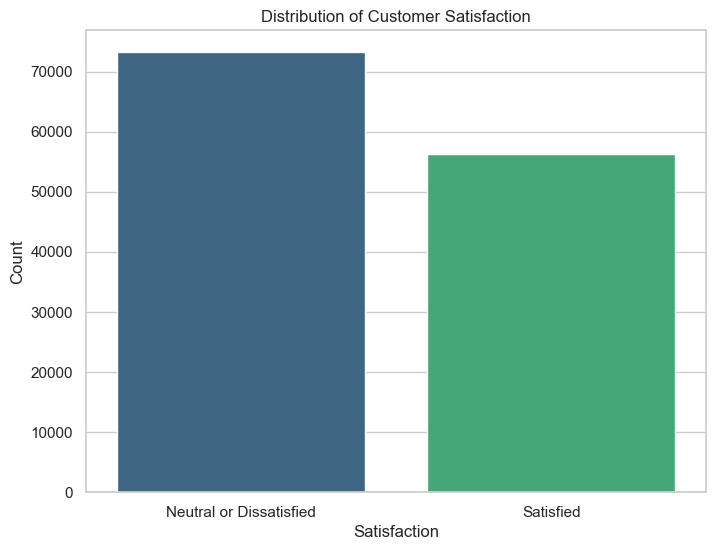

In [47]:
# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Calculate counts of each satisfaction category
satisfaction_counts = df['Satisfaction'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
sns.barplot(x=satisfaction_counts.index, y=satisfaction_counts.values, palette='viridis')

# Adding title and labels
plt.title('Distribution of Customer Satisfaction')
plt.xlabel('Satisfaction')
plt.ylabel('Count')

# Show the plot
plt.show()

* The count of passengers who are either neutral or dissatisfied is slightly higher than the count of those who are satisfied.

* Since the difference in counts isn't very large, this indicates that the overall customer satisfaction level is fairly balanced across the surveyed population.

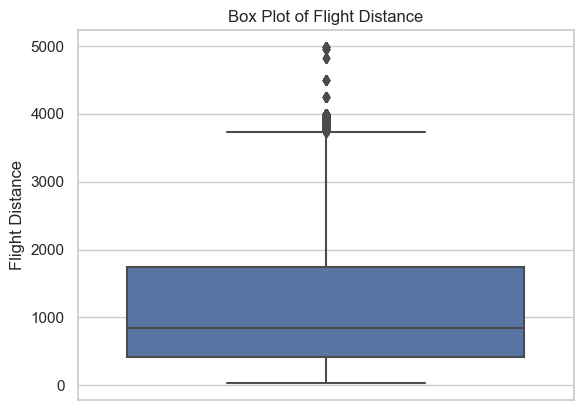

In [48]:
# Boxplot for 'Flight Distance'
fig, ax = plt.subplots()  
sns.boxplot(
    x = None, 
    y = 'Flight Distance',
    data=df,
    ax=ax  
)
plt.title('Box Plot of Flight Distance')
plt.show()

* There are no anomalies such as negative distances, which would require correction.
* The presence of outliers indicates that there are some flights that are much longer than typical but still within possible ranges for commercial flights. 

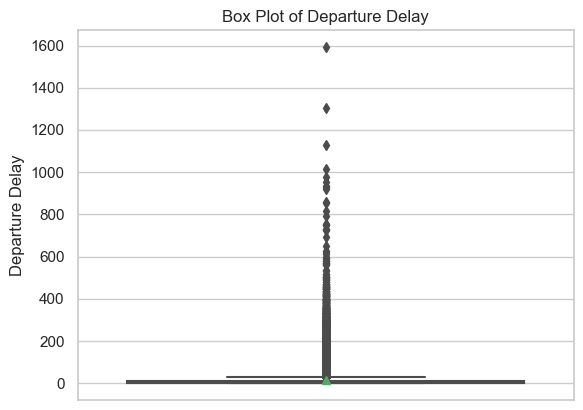

In [49]:
# Boxplot for 'Departure Delay'
fig, ax = plt.subplots()  
sns.boxplot(
    x = None, 
    y = "Departure Delay",
    data=df,
    showmeans=True, 
    ax=ax 
)

plt.title('Box Plot of Departure Delay')
plt.show()

* There are a few cases of extreme delays, going up to 1600 minutes. These could be due to extraordinary circumstances such as extreme weather, technical issues, or other rare events that are not typical of the standard operational delays. 
* Such extreme outliers could have a substantial negative impact on customer satisfaction, and addressing these could be a key to improving overall satisfaction.

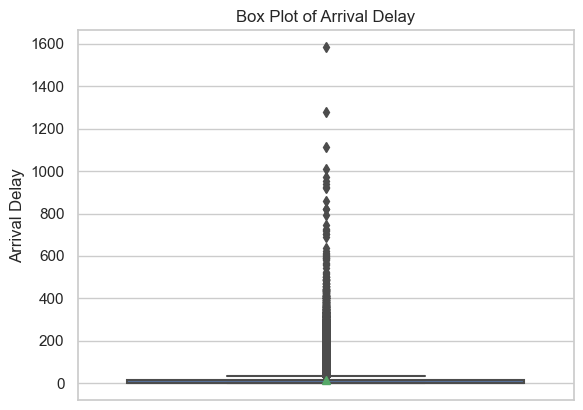

In [50]:
# Boxplot for 'Arrival Delay'
fig, ax = plt.subplots()  
sns.boxplot(
    x = None, 
    y = "Arrival Delay",
    data=df,
    showmeans=True,  
    ax=ax 
)

plt.title('Box Plot of Arrival Delay')
plt.show()

*  There are several points above the upper whisker that indicate outlier flights with unusually long arrival delays. These outliers are noteworthy and could be caused by various factors, such as air traffic, weather conditions, or operational issues.
* From a management perspective, focusing on the reasons behind the extreme outliers could help improve service reliability and passenger satisfaction. 

## DATA VISUALIZATION

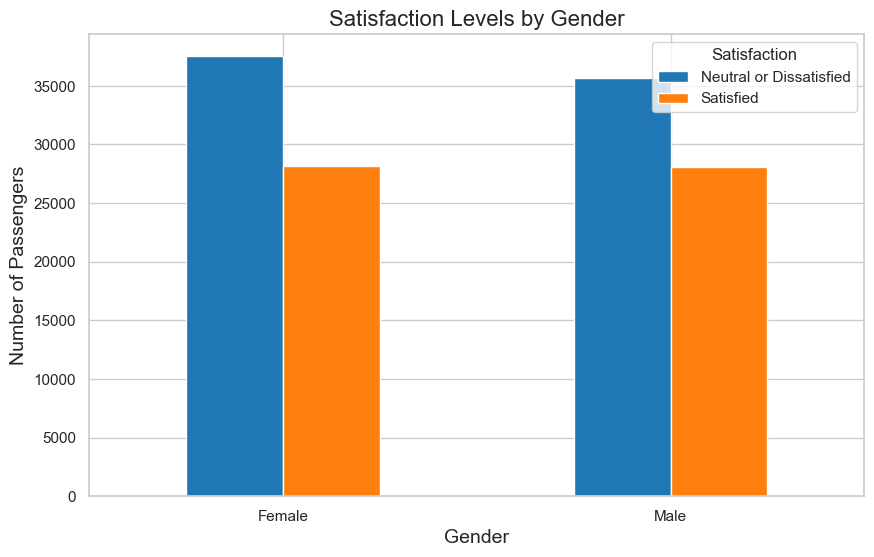

In [51]:
# Visualization 1: Satisfaction Levels by Gender Type

sns.set(style="whitegrid")

# Create a figure and a set of subplots
fig, ax = plt.subplots(figsize=(10, 6))

# Prepare data: Calculate counts for each combination of Gender and Satisfaction
counts = df.groupby(['Gender', 'Satisfaction']).size().unstack(fill_value=0)

# Plot each satisfaction category by gender
counts.plot(kind='bar', ax=ax, color=['#1f77b4', '#ff7f0e'])  # colors are optional, adjust as needed

# Customize the plot
ax.set_title('Satisfaction Levels by Gender', fontsize=16)
ax.set_xlabel('Gender', fontsize=14)
ax.set_ylabel('Number of Passengers', fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)  # Rotate labels if needed

# Show the plot
plt.show()

 * Both genders show a relatively similar distribution between satisfaction levels, with slightly more males represented in both the satisfied and neutral or dissatisfied categories.
 * While the counts of satisfied customers are fairly close between genders, there is a noticeable difference in the counts of neutral or dissatisfied customers, with more males falling into this category.

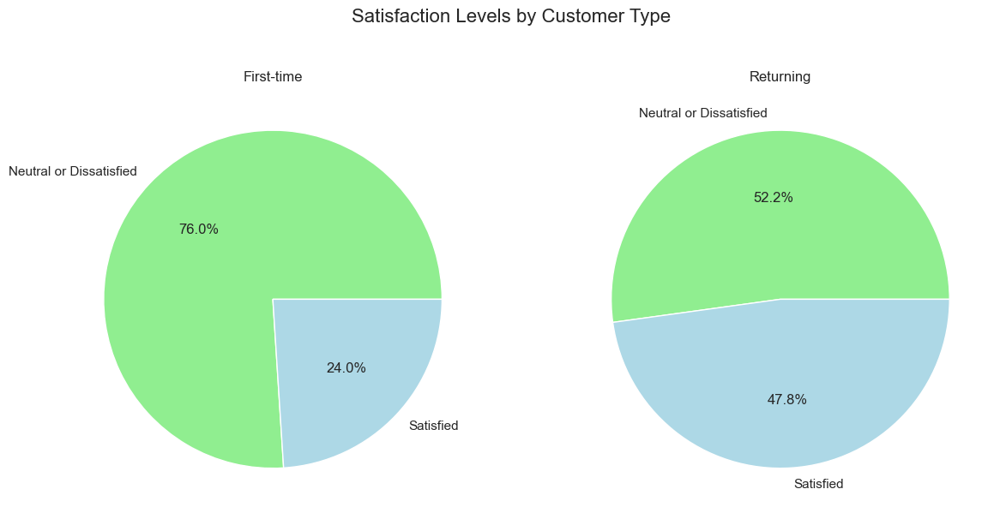

In [52]:
# Visualization 2: Satisfaction Levels by Customer Type

df_customer_satisfaction = df.groupby(['Customer Type', 'Satisfaction']).size().reset_index(name='counts')

# Unique customer types for creating subplots
customer_types = df_customer_satisfaction['Customer Type'].unique()

# Create a figure with subplots - one for each customer type
fig, axes = plt.subplots(1, len(customer_types), figsize=(14, 7))  # Adjust figsize as needed

# Define colors for the categories
colors = {'Satisfied': 'lightblue', 'Neutral or Dissatisfied': 'lightgreen'}

for ax, customer_type in zip(axes, customer_types):
    data = df_customer_satisfaction[df_customer_satisfaction['Customer Type'] == customer_type]
    ax.pie(data['counts'], labels=data['Satisfaction'], autopct='%1.1f%%', colors=[colors[label] for label in data['Satisfaction']])
    ax.set_title(customer_type)

# Overall title
plt.suptitle('Satisfaction Levels by Customer Type', fontsize=16)

# Show the plot
plt.show()

* __First-time vs. Returning Satisfaction:__ A large majority (76%) of first-time customers are neutral or dissatisfied with their experience, whereas returning customers are almost evenly split, with a slight majority (52.2%) being satisfied. This suggests that the experience improves or meets expectations more often for those who have flown with the airline before.
*  It might also suggest that returning customers have adjusted their expectations based on previous flights, which could contribute to a higher satisfaction rate.
* The airline may want to investigate what is contributing to the dissatisfaction of first-time flyers and consider implementing changes or targeted strategies to improve the first-time customer experience.

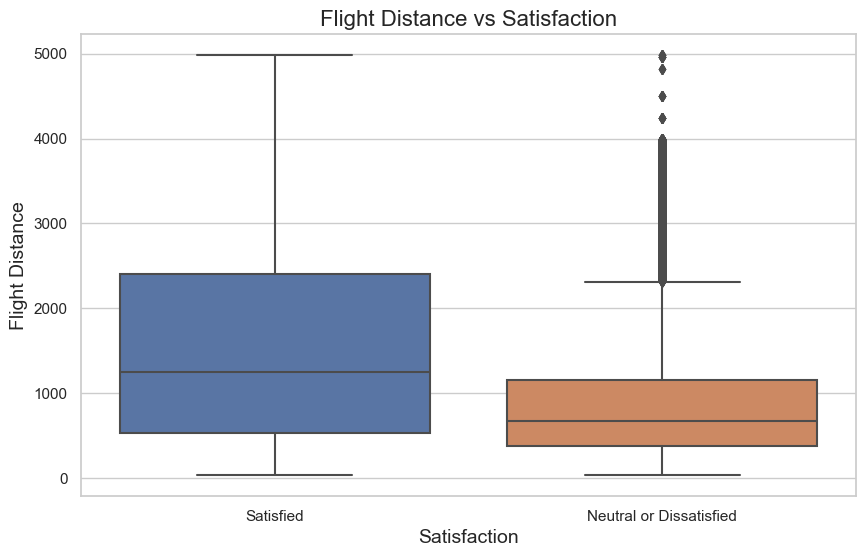

In [53]:
# Visualization 3: Satisfaction Levels by Flight Distance
sns.set(style="whitegrid")


df['Satisfaction'] = pd.Categorical(df['Satisfaction'], categories=["Satisfied", "Neutral or Dissatisfied"], ordered=True)

# Create a box plot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x='Satisfaction', y='Flight Distance', data=df)

# Customize the plot
ax.set_title('Flight Distance vs Satisfaction', fontsize=16)
ax.set_xlabel('Satisfaction', fontsize=14)
ax.set_ylabel('Flight Distance', fontsize=14)

# Show the plot
plt.show()

* __Higher Median Flight Distance for Satisfied Customers:__ This could suggest that passengers with longer flight distances have higher satisfaction levels, possibly due to a perception of better value or more comprehensive service on longer flights.
* For both satisfied and neutral or dissatisfied customers, the distributions are relatively symmetrical around the median, as indicated by the approximately equal lengths of the boxes above and below the median line. This symmetry suggests that for both groups, there is a similar spread of flight distances above and below the median.

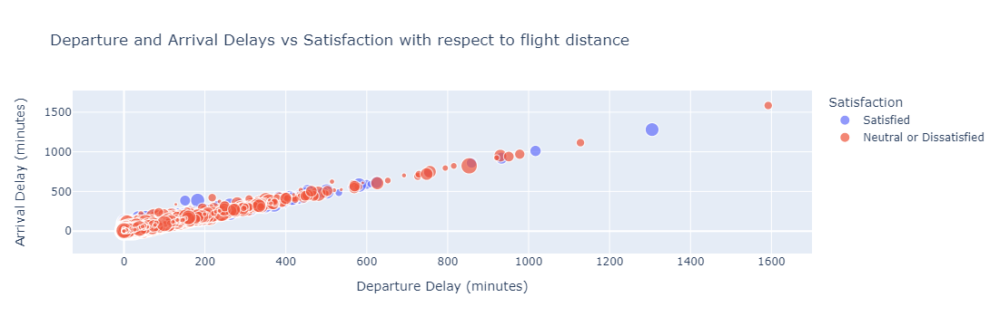

In [54]:
# Visualization 4: Satisfaction Levels by Flight Delay
fig4 = px.scatter(df, x="Departure Delay", y="Arrival Delay",
                           color="Satisfaction", size="Flight Distance",
                           title="Departure and Arrival Delays vs Satisfaction with respect to flight distance",
                           category_orders={"Satisfaction": ["Satisfied", "Neutral or Dissatisfied"]},
                           labels={"Departure Delay": "Departure Delay (minutes)", "Arrival Delay": "Arrival Delay (minutes)", "Flight Distance": "Flight Distance (miles)"},
                           hover_data=["Flight Distance"])

fig4.show()

* __Correlation Between Departure and Arrival Delays:__ There is a clear positive correlation between departure and arrival delays. As departure delays increase, arrival delays tend to increase as well, which is intuitive as flights that leave late often arrive late.
* **Satisfaction Concentration in Lower Delays:** Most of the satisfied customers are concentrated in the area with lower departure and arrival delays. This suggests that shorter delays are associated with higher satisfaction levels, which aligns with the expectation that passengers prefer to depart and arrive on time.
* As the delays increase, the proportion of neutral or dissatisfied customers appears to increase as well.

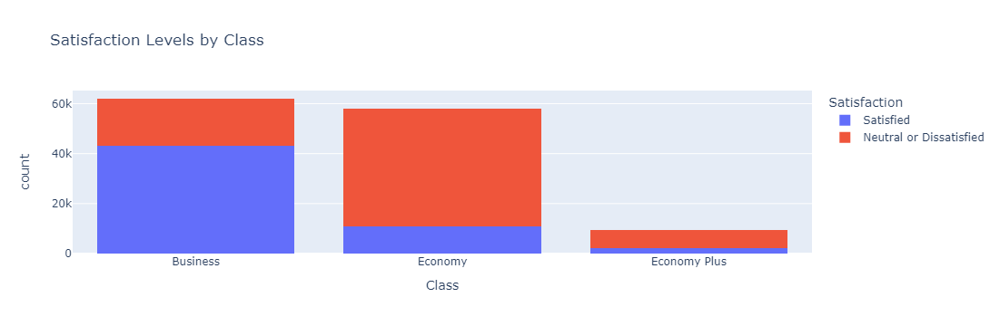

In [55]:
# Visualization 5: Satisfaction Levels by class
fig5 = px.histogram(df, x="Class", color="Satisfaction", barmode="stack",
                    title="Satisfaction Levels by Class",
                    category_orders={"Satisfaction": ["Satisfied", "Neutral or Dissatisfied"]})
fig5.show()

* __Proportional Satisfaction by Class:__ Business class shows a higher proportion of satisfied customers compared to Economy and Economy Plus. This might indicate that the services and comfort associated with Business class lead to a higher satisfaction rate.
* __High Volume of Neutral or Dissatisfied in Economy:__ Economy class has the highest count of both satisfied and neutral or dissatisfied passengers, but the proportion of neutral or dissatisfied is particularly high compared to Business class. This suggests that passengers in Economy are less likely to be satisfied than those in Business class.
* __Economy Plus:__ For Economy Plus, while the total counts are lower, the proportion of neutral or dissatisfied passengers is quite significant compared to satisfied passengers, similar to the Economy class. This might imply that the additional benefits of Economy Plus over standard Economy are not translating into higher satisfaction levels as effectively as the benefits of Business class.

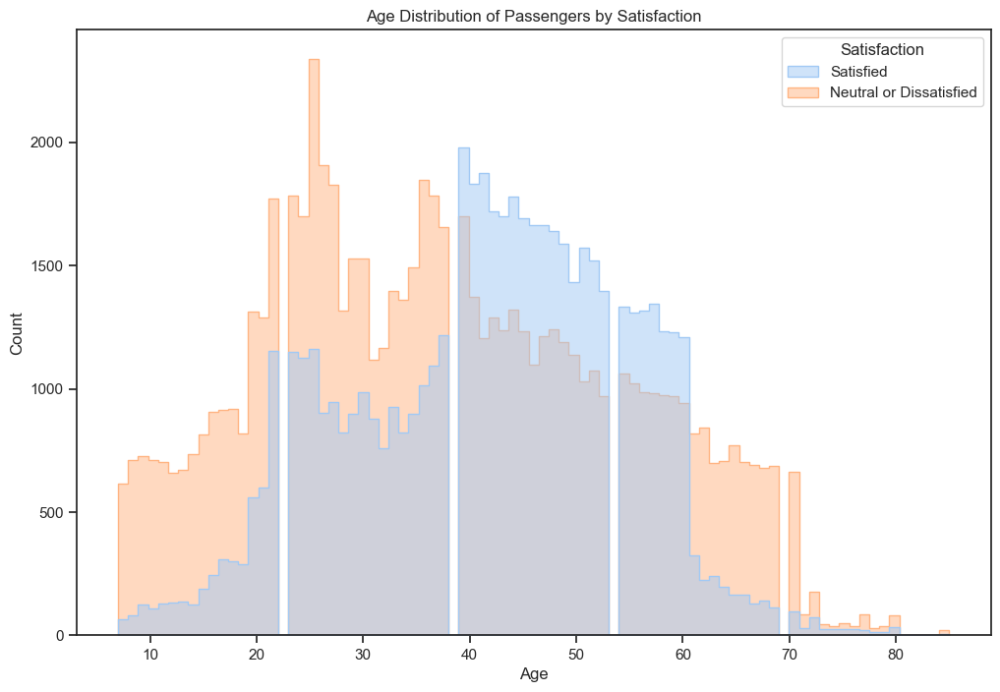

In [56]:
# Visualization 6: Age Distribution of Passengers by Satisfaction

sns.set_theme(style="ticks", palette="pastel")

# Create the histogram plot
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x="Age", hue="Satisfaction", element="step", stat="count",
             common_norm=False, kde=False, fill=True, alpha=0.5)

# Customize the plot
plt.title('Age Distribution of Passengers by Satisfaction')
plt.xlabel('Age')
plt.ylabel('Count')

# Show the plot
plt.show()

* __Age Groups:__ Both satisfied and neutral or dissatisfied passengers span a wide range of ages. The distribution suggests a large proportion of passengers are in their 20s to 40s.
* __Peak Satisfaction Ages:__ The peak for satisfied passengers appears to be in the late 30s to early 40s age range, indicating that passengers in this age group are more likely to be satisfied with their flying experience compared to other age groups.
* __Younger and Older Passengers:__ There seems to be a notable number of neutral or dissatisfied passengers in the younger (20s) and older (60s and above) age ranges. This could suggest that the expectations and experiences of these age groups are not being met as effectively as those in the middle age ranges.

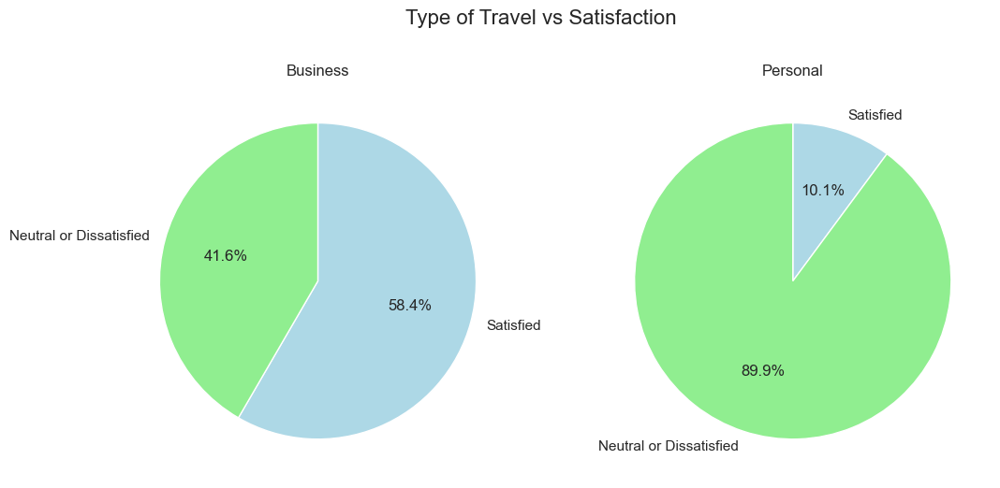

In [57]:
# Visualization 7: Type of Travel vs Satisfaction

df_travel_type_satisfaction = df.groupby(['Type of Travel', 'Satisfaction']).size().reset_index(name='counts')

# Unique types of travel for creating separate pie charts
travel_types = df_travel_type_satisfaction['Type of Travel'].unique()

# Setup the figure and axes for the subplots
fig, axes = plt.subplots(1, len(travel_types), figsize=(12, 6))  # Adjust the figsize based on the number of travel types

# Define colors for the categories
colors = ['lightblue', 'lightgreen']  # Customize colors if needed

# Loop over each type of travel and create a pie chart
for ax, travel_type in zip(axes, travel_types):
    data = df_travel_type_satisfaction[df_travel_type_satisfaction['Type of Travel'] == travel_type]
    ax.pie(data['counts'], labels=data['Satisfaction'], autopct='%1.1f%%', colors=colors, startangle=90, counterclock=False)
    ax.set_title(travel_type)

# Overall title
plt.suptitle('Type of Travel vs Satisfaction', fontsize=16)

# Show the plot
plt.show()

* __Higher Satisfaction in Business Travel:__ The chart on the left shows that a majority of business travelers, 58.4%, are satisfied with their travel experience. In contrast, only a small proportion, 41.6%, are neutral or dissatisfied.
* __Lower Satisfaction in Personal Travel:__ For personal travel, the satisfaction level is significantly lower, with only 10.1% of passengers reporting being satisfied and a vast majority of 89.9% being neutral or dissatisfied.

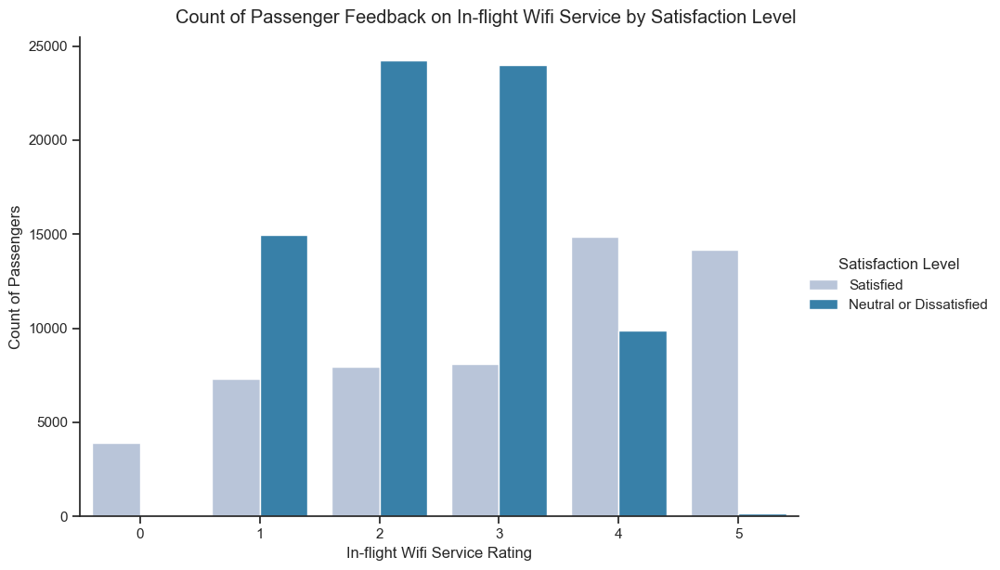

In [58]:
# Visualization 8: Count of Passenger Feedback on In-flight Wifi Service by Satisfaction Level

sns.set_theme(style="ticks", palette="pastel")


wifi_rating_counts = df.groupby(['Satisfaction', 'In-flight Wifi Service']).size().reset_index(name='Count')

# Convert 'In-flight Wifi Service' to a categorical type for ordering
wifi_rating_counts['In-flight Wifi Service'] = pd.Categorical(wifi_rating_counts['In-flight Wifi Service'], 
                                                              categories=sorted(df['In-flight Wifi Service'].unique()), 
                                                              ordered=True)

# Create a grouped bar chart using Seaborn's catplot
g = sns.catplot(data=wifi_rating_counts, kind='bar', x='In-flight Wifi Service', y='Count', 
                hue='Satisfaction', height=6, aspect=1.5, palette='PuBu')  # Adjust height and aspect to suit your display preferences

# Customize the plot
g.fig.suptitle('Count of Passenger Feedback on In-flight Wifi Service by Satisfaction Level', y=1.02)  # Adjust title padding if needed
g.set_axis_labels("In-flight Wifi Service Rating", "Count of Passengers")
g.set_titles("Satisfaction: {col_name}")  # This will set subplots title if using `col` parameter in `catplot`
g._legend.set_title("Satisfaction Level")

# Show the plot
plt.show()

* Passengers who rated the in-flight Wi-Fi service as a 3 or higher show a higher likelihood of being satisfied. Particularly, those who gave a rating of 5 appear to be the most satisfied.
* __The Critical Mid-Range:__ The rating of 3 has a notable split between satisfied and neutral or dissatisfied passengers, indicating that it is a threshold rating for in-flight Wi-Fi service. It seems to be the point at which the service is just satisfactory enough for some passengers and not for others.